<div align="center">
<p align="center" style="width: 100%;">
    <img src="https://raw.githubusercontent.com/vlm-run/.github/refs/heads/main/profile/assets/vlm-black.svg" alt="VLM Run Logo" width="80" style="margin-bottom: -5px; color: #2e3138; vertical-align: middle; padding-right: 5px;"><br>
</p>
<p align="center"><a href="https://docs.vlm.run"><b>Website</b></a> | <a href="https://docs.vlm.run/"><b>API Docs</b></a> | <a href="https://docs.vlm.run/blog"><b>Blog</b></a> | <a href="https://discord.gg/AMApC2UzVY"><b>Discord</b></a> | <a href="https://chat.vlm.run"><b>Chat</b></a>
</p>
</div>

# VLM Run Orion - First & Last Frame Video Generation

This comprehensive cookbook demonstrates how to generate videos from first and last frames using [VLM Run Orion](https://vlm.run/orion). For more details on the API, see the [Agent API docs](https://docs.vlm.run/agents/introduction).

For this notebook, we'll cover how to use the **VLM Run Agent Chat Completions API** for video generation workflows.

We'll cover the following topics:
 1. Generate and display a first frame from a text prompt
 2. Generate and display a last frame based on the first frame
 3. Generate a video using both first and last frames
 4. Multi-scene video creation with frame interpolation

## Prerequisites

- Python 3.10+
- VLM Run API key (get one at [app.vlm.run](https://app.vlm.run))
- VLM Run Python Client with OpenAI extra `vlmrun[openai]`


## Setup

First, install the required packages and configure the environment.


In [1]:
# Install required packages
%pip install vlmrun[openai] --upgrade --quiet
%pip install cachetools pillow requests numpy --quiet


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import os
import getpass

VLMRUN_API_KEY = os.getenv("VLMRUN_API_KEY", None)
if VLMRUN_API_KEY is None:
    VLMRUN_API_KEY = getpass.getpass("Enter your VLM Run API key: ")


## Initialize the VLM Run Client

We use the OpenAI-compatible chat completions interface through the VLM Run SDK.


In [3]:
from vlmrun.client import VLMRun

BASE_URL = os.getenv("VLMRUN_BASE_URL", "https://agent.vlm.run/v1")
client = VLMRun(api_key=VLMRUN_API_KEY, base_url=BASE_URL)
print("VLM Run client initialized successfully!")
print(f"Base URL: {BASE_URL}")


VLM Run client initialized successfully!
Base URL: https://agent.vlm.run/v1


## Response Models (dtypes)

We define Pydantic models for structured outputs. These models include **cached properties** that automatically download and convert images/videos from URLs to PIL Images or file paths for easy manipulation.


In [4]:
from typing import List, Optional

from PIL import Image
from pydantic import BaseModel, Field
from vlmrun.types import ImageRef, VideoRef
from vlmrun.common.utils import download_image


class FirstFrameResponse(BaseModel):
    """Response containing the generated first frame."""
    first_frame: ImageRef = Field(..., description="The generated first frame of the video")
    description: str = Field(..., description="Description of the first frame")


class LastFrameResponse(BaseModel):
    """Response containing the generated last frame."""
    last_frame: ImageRef = Field(..., description="The generated last frame of the video")
    description: str = Field(..., description="Description of the last frame")
    transition_summary: str = Field(..., description="Summary of how the scene transitions from first to last frame")


class VideoGenerationResponse(BaseModel):
    """Response containing the generated video."""
    video: VideoRef = Field(..., description="The generated video")
    duration: Optional[float] = Field(None, description="Duration of the video in seconds")
    fps: Optional[int] = Field(None, description="Frames per second")
    resolution: Optional[str] = Field(None, description="Video resolution (e.g., 1920x1080)")
    description: str = Field(..., description="Description of the generated video")


class MultiSceneVideoResponse(BaseModel):
    """Response containing multi-scene video."""
    video: VideoRef = Field(..., description="The generated multi-scene video")
    scene_count: int = Field(..., description="Number of scenes in the video")
    total_duration: float = Field(..., description="Total duration in seconds")
    description: str = Field(..., description="Overall description of the video")


print("Response models defined successfully!")
print("Models include cached properties for automatic artifact downloading.")


Response models defined successfully!
Models include cached properties for automatic artifact downloading.


In [5]:
import hashlib
import json
from typing import Any, Type, TypeVar

import cachetools
from IPython.display import HTML, Video as IPyVideo
from vlmrun.common.image import encode_image


T = TypeVar('T', bound=BaseModel)


def display_images(images: Image.Image | list[Image.Image], texts: list[str] | None = None, width: int = 300):
    """Display images with optional captions in a nice grid layout."""
    if isinstance(images, Image.Image):
        images = [images]
    if texts is None:
        texts = [None] * len(images)
    elif isinstance(texts, str):
        texts = [texts]
    elif len(texts) != len(images):
        raise ValueError("`texts` must be a list of the same length as `images`")

    imgs_html = ""
    for image, text in zip(images, texts):
        W, H = image.size
        if W > width:
            H = int(H * width / W)
            W = width
            image = image.resize((W, H))
        im_bytes = encode_image(image, format="JPEG")
        imgs_html += f"<div style='display:inline-block; margin:5px; text-align:center'>"
        imgs_html += f"<img src='{im_bytes}' style='width:{width}px; border-radius:6px'>"
        if text:
            imgs_html += f"<div style='font-size:12px; color:#666; margin-top:5px'>{text}</div>"
        imgs_html += f"</div>"
    return HTML(f"<div style='display:flex; flex-wrap:wrap'>{imgs_html}</div>")


def display_video(video_path: str, width: int = 600):
    """Display a video in the notebook."""
    return IPyVideo(video_path, width=width, embed=True)


def custom_key(prompt: str, images: list[Image.Image] | list[str] | None = None, response_model: Type[T] | None = None, model: str = "vlmrun-orion-1:auto"):
    """Custom key for caching chat_completion."""
    image_keys = []
    if images:
        for image in images:
            if isinstance(image, Image.Image):
                thumb = image.copy()
                thumb.thumbnail((128, 128))
                encoded = encode_image(thumb, format="JPEG")
                image_keys.append(encoded)
            elif isinstance(image, str):
                image_keys.append(image)

    response_key = hashlib.sha256(json.dumps(response_model.model_json_schema(), sort_keys=True).encode()).hexdigest() if response_model else ""
    return (prompt, tuple(image_keys), response_key, model)


@cachetools.cached(cache=cachetools.TTLCache(maxsize=1000, ttl=3600), key=custom_key)
def chat_completion(
    prompt: str,
    images: list[Image.Image] | list[str] | None = None,
    response_model: Type[T] | None = None,
    model: str = "vlmrun-orion-1:auto"
) -> tuple[str | BaseModel, str]:
    """
    Make a chat completion request with optional images and structured output.

    Args:
        prompt: The text prompt/instruction
        images: Optional list of images to process (either PIL Images or URLs)
        response_model: Optional Pydantic model for structured output
        model: Model to use (default: vlmrun-orion-1:auto)

    Returns:
        Tuple of (parsed response, session_id)
    """
    content = []
    content.append({"type": "text", "text": prompt})

    if images:
        for image in images:
            if isinstance(image, str):
                assert image.startswith("http"), "Image URLs must start with http or https"
                content.append({"type": "image_url", "image_url": {"url": image, "detail": "auto"}})
            elif isinstance(image, Image.Image):
                content.append({"type": "image_url", "image_url": {"url": encode_image(image, format="JPEG"), "detail": "auto"}})
            else:
                raise ValueError("Images must be either PIL Images or URLs")

    kwargs = {
        "model": model,
        "messages": [{"role": "user", "content": content}]
    }

    if response_model:
        kwargs["response_format"] = {
            "type": "json_schema",
            "schema": response_model.model_json_schema()
        }

    response = client.agent.completions.create(**kwargs)
    response_text = response.choices[0].message.content

    if response_model:
        return response_model.model_validate_json(response_text), response.session_id

    return response_text, response.session_id


print("Helper functions defined!")


Helper functions defined!


>> RESPONSE
Description: A stunning, cinematic close-up of a bee meticulously gathering nectar from a vibrant, blooming flower. The bee's delicate, translucent wings are captured in sharp detail, and its legs are dusted with golden pollen. Soft, warm morning light bathes the scene, accentuating the rich textures and colors of the flower petals. A shallow depth of field creates a beautiful, creamy bokeh effect in the lush green garden background, making the bee and flower the central focus of this serene natural moment.
First Frame ID: img_8c8bea

>> FIRST FRAME



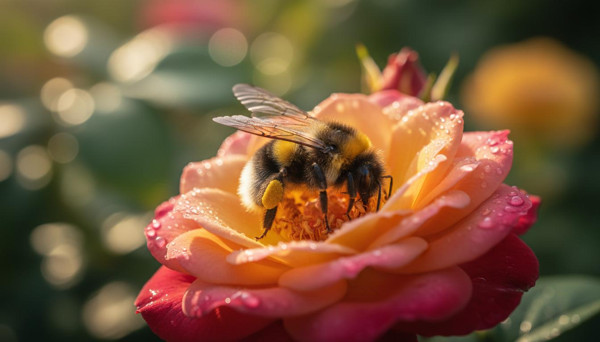

In [13]:
# Define the scene for the first frame
first_frame_prompt = """
Generate a cinematic first frame for a video:
Scene: A close-up of a bee gently sitting on a blooming flower in a natural garden.
Style: Cinematic, high quality, vibrant colors, shallow depth of field.
Aspect ratio: 16:9
Details: The bee is collecting nectar, delicate wings visible, pollen on its legs. Soft morning light highlights the flower petals, with a blurred green background and subtle bokeh.

Return the generated image as 'first_frame' and provide a detailed description.
"""


result, session_id = chat_completion(
    prompt=first_frame_prompt,
    response_model=FirstFrameResponse,
    model="vlmrun-orion-1:auto"
)

print(">> RESPONSE")
print(f"Description: {result.description}")
print(f"First Frame ID: {result.first_frame.id}")

# Get the image artifact from the response
first_frame_img: Image.Image = client.artifacts.get(session_id=session_id, object_id=result.first_frame.id)

print("\n>> FIRST FRAME")
display_images(images=[first_frame_img], texts=["First Frame: " + result.description], width=600)


## 2. Generate Last Frame

Now let's generate the last frame that shows how the scene evolves. The last frame should maintain consistency with the first frame while showing progression.


>> RESPONSE
Description: This cinematic last frame captures the bumblebee at the culmination of its journey, landing at the entrance of a natural honeycomb. The bee is in sharp detail, its pollen baskets full and its body glowing in the warm, golden light of the hive. Droplets of fresh honey glisten on the hexagonal wax cells, emphasizing the abundance of the harvest. The shallow depth of field and vibrant, warm color grading create a sense of peaceful completion and biological realism.
Transition: The scene progresses from the start of a foraging mission on a fresh, dew-kissed rose to the triumphant return at the hive. The transition moves from the cool, bright colors of the garden to the rich, warm tones of the honeycomb, illustrating the full circle of the pollination process and the bee's vital role in its colony's survival.
Last Frame ID: img_d7b775

>> FIRST AND LAST FRAMES



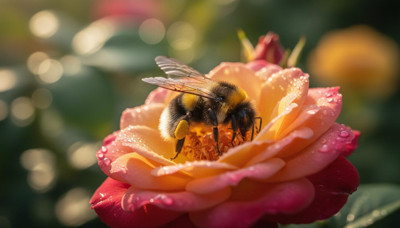
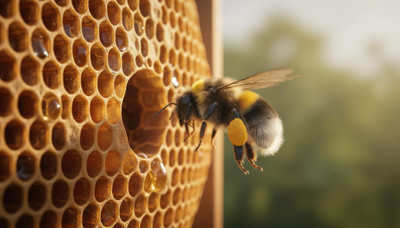

In [18]:
# Define the scene for the last frame
last_frame_prompt = """
Based on the provided first frame image, generate a cinematic last frame that shows the scene progression:

Evolution: The bee has finished collecting nectar and has returned to its natural honey comb. The bee is shown arriving at the hive entrance, carrying visible pollen and nectar sacs, indicating a successful foraging trip. Drops of golden honey glisten nearby, suggesting abundance and completion.

Style: Maintain the same cinematic, high-quality visual style with vibrant natural colors and shallow depth of field.
Aspect ratio: 16:9

Consistency: Keep the same realistic lighting tone, color grading, and biological accuracy of the bee as in the first frame, while transitioning the environment from flower garden to hive naturally.

Mood: Warm, rewarding, and peaceful—signifying the completion of a natural cycle.

Return the generated image as 'last_frame', provide a detailed description, and summarize the transition.
"""


result, session_id = chat_completion(
    prompt=last_frame_prompt,
    images=[first_frame_img],
    response_model=LastFrameResponse,
    model="vlmrun-orion-1:auto"
)

print(">> RESPONSE")
print(f"Description: {result.description}")
print(f"Transition: {result.transition_summary}")
print(f"Last Frame ID: {result.last_frame.id}")

# Get the image artifact from the response
last_frame_img: Image.Image = client.artifacts.get(session_id=session_id, object_id=result.last_frame.id)

print("\n>> FIRST AND LAST FRAMES")
display_images(
    images=[first_frame_img, last_frame_img],
    texts=["First Frame", "Last Frame"],
    width=400
)


## 3. Generate Video from First and Last Frames

Now that we have both frames, let's generate a smooth video transition between them using AI-powered frame interpolation.


In [24]:
# Generate video from first and last frames
video_generation_prompt = """
You are provided with two images: the first frame and the last frame of a video.

Generate a smooth, cinematic video that transitions from the first frame to the last frame:

Scenario: A bee collecting nectar from a flower transitions into the bee returning to its hive after a successful foraging trip.

- Duration: 6 seconds
- Style: Cinematic, high-quality, smooth interpolation with realistic motion
- Motion: Natural bee flight path from flower to hive, gentle wing movement, subtle camera drift
- Lighting: Soft morning light progressing slightly warmer as the bee reaches the hive
- Environment: Gradual transition from a garden with flowers and greenery to the beehive structure
- Continuity: Maintain biological accuracy of the bee, consistent color grading, and a stable 16:9 aspect ratio

The video should show a seamless narrative transition, emphasizing natural behavior and a calm, rewarding mood.

Return the generated video and provide valid reference to download.
"""


result, session_id = chat_completion(
    prompt=video_generation_prompt,
    images=[first_frame_img, last_frame_img],
    response_model=VideoGenerationResponse,
    model="vlmrun-orion-1:auto"
)

print(">> RESPONSE")
print(f"Description: {result.description}")
print(f"Duration: {result.duration}s")
print(f"FPS: {result.fps}")
print(f"Resolution: {result.resolution}")
print(f"Video ID: {result.video.id}")

>> RESPONSE
Description: A cinematic 6-second video showing a bumblebee's journey from a flower in a morning garden to its honeycomb hive. The bee takes off from a dew-kissed rose, flies with realistic wing beats and natural motion, and arrives at the hive as the light shifts to a warm golden glow. The transition is smooth and biologically accurate, capturing the calm and rewarding narrative of foraging.
Duration: 6.0s
FPS: None
Resolution: 1280x720
Video ID: vid_7b9bd7


In [25]:
# Get the video artifact from the response
video_path = client.artifacts.get(session_id=session_id, object_id=result.video.id)

print("\n>> GENERATED VIDEO")
display_video(video_path, width=800)


>> GENERATED VIDEO


## 4. Multi-Scene Video Creation

Create a video with multiple scenes by generating multiple frame pairs and combining them into a single video.


>> MULTI-SCENE FRAMES GENERATED
Description: A series of 6 cinematic frames showing the progression of a day from pre-dawn in a forest to a golden hour sunset over a lake.

>> ALL SCENE FRAMES



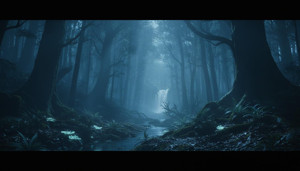
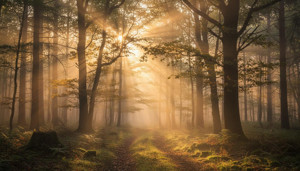
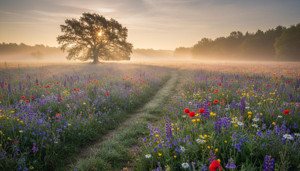
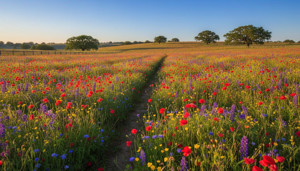
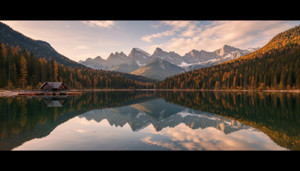
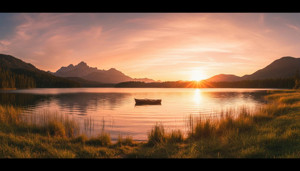

In [26]:
# Generate frames for multiple scenes
scenes_prompt = """
Generate 6 cinematic frames for a nature video showing the progression of a day:

Scene 1 (Start): Pre-dawn darkness in a forest, dim blue tones
Scene 1 (End): Dawn breaking through trees, warm golden light
Scene 2 (Start): Morning in a meadow with flowers, soft sunlight
Scene 2 (End): Midday in the same meadow, bright vibrant colors
Scene 3 (Start): Afternoon by a lake, clear reflections
Scene 3 (End): Golden hour sunset over the lake, orange and pink sky

All frames should be 16:9 aspect ratio, cinematic style, high quality.
Return all 6 frames as separate ImageRef objects with descriptions.
"""

class MultiSceneFramesResponse(BaseModel):
    scene1_start: ImageRef = Field(..., description="Scene 1 starting frame")
    scene1_end: ImageRef = Field(..., description="Scene 1 ending frame")
    scene2_start: ImageRef = Field(..., description="Scene 2 starting frame")
    scene2_end: ImageRef = Field(..., description="Scene 2 ending frame")
    scene3_start: ImageRef = Field(..., description="Scene 3 starting frame")
    scene3_end: ImageRef = Field(..., description="Scene 3 ending frame")
    description: str = Field(..., description="Overall description of the scenes")

result, session_id = chat_completion(
    prompt=scenes_prompt,
    response_model=MultiSceneFramesResponse,
    model="vlmrun-orion-1:auto"
)

print(">> MULTI-SCENE FRAMES GENERATED")
print(f"Description: {result.description}")

# Download all frames
scene_frames = [
    client.artifacts.get(session_id=session_id, object_id=result.scene1_start.id),
    client.artifacts.get(session_id=session_id, object_id=result.scene1_end.id),
    client.artifacts.get(session_id=session_id, object_id=result.scene2_start.id),
    client.artifacts.get(session_id=session_id, object_id=result.scene2_end.id),
    client.artifacts.get(session_id=session_id, object_id=result.scene3_start.id),
    client.artifacts.get(session_id=session_id, object_id=result.scene3_end.id),
]

scene_labels = [
    "Scene 1 Start: Forest Pre-dawn",
    "Scene 1 End: Forest Dawn",
    "Scene 2 Start: Meadow Morning",
    "Scene 2 End: Meadow Midday",
    "Scene 3 Start: Lake Afternoon",
    "Scene 3 End: Lake Sunset"
]

print("\n>> ALL SCENE FRAMES")
display_images(images=scene_frames, texts=scene_labels, width=300)


In [29]:
# Combine all scenes into one video
multi_scene_video_prompt = """
You are provided with 6 frames representing 3 scenes showing the progression of a day in nature.

Generate a seamless multi-scene video:
- Scene 1 (frames 1-2): Forest from pre-dawn to dawn (2 seconds)
- Scene 2 (frames 3-4): Meadow from morning to midday (2 seconds)
- Scene 3 (frames 5-6): Lake from afternoon to sunset (2 seconds)

Total duration: 6 seconds
Transitions: Smooth dissolve transitions between scenes (0.1s each)
Style: Cinematic nature documentary quality

Return the generated video reference to download with metadata including scene count and total duration.
"""

result, session_id = chat_completion(
    prompt=multi_scene_video_prompt,
    images=scene_frames,
    response_model=MultiSceneVideoResponse,
    model="vlmrun-orion-1:auto"
)

print(">> MULTI-SCENE VIDEO GENERATED")
print(f"Description: {result.description}")
print(f"Scene count: {result.scene_count}")
print(f"Total duration: {result.total_duration}s")

multi_scene_video_path = client.artifacts.get(session_id=session_id, object_id=result.video.id)

print("\n>> MULTI-SCENE VIDEO")
display_video(multi_scene_video_path, width=800)


>> MULTI-SCENE VIDEO GENERATED
Description: A 6-second cinematic nature documentary video following the progression of a day across three distinct landscapes. The journey begins in a mystical, bioluminescent forest at pre-dawn, transitioning into a sun-drenched forest path at dawn. The scene then dissolves into a vibrant meadow of wildflowers under the morning and midday sun. Finally, the video moves to a serene autumn lake framed by mountains, concluding with a tranquil sunset over the water featuring a lone rowboat.
Scene count: 3
Total duration: 6.0s

>> MULTI-SCENE VIDEO


---

## Conclusion

This cookbook demonstrated comprehensive video generation capabilities using the **VLM Run Orion Agent API** with first and last frame workflows.

### Key Takeaways

1. **First Frame Generation**: Create high-quality starting frames that establish scene composition, style, and mood.
2. **Last Frame Generation**: Generate consistent ending frames that show natural progression while maintaining visual continuity.
3. **Video Interpolation**: Use AI-powered frame interpolation to create smooth videos from keyframes with natural motion.
4. **Artifact Handler**: Always use `ImageRef` and `VideoRef` types with `client.artifacts.get()` to retrieve generated media.
5. **Structured Outputs**: Leverage Pydantic models for type-safe responses with automatic validation and metadata.
6. **Advanced Features**: Support for multi-scene videos, style transfer, camera movements, and custom parameters.
7. **Flexible Prompting**: Natural language prompts allow precise control over visual style, motion, and transitions.

### Use Cases

- **Product Showcases**: Create professional product videos with smooth rotations and lighting effects
- **Animated Stories**: Generate animated sequences with consistent artistic styles
- **Time-lapse Videos**: Show scene transformations over time (day/night, seasons, weather)
- **Marketing Content**: Create engaging visual content for social media and advertising
- **Educational Videos**: Demonstrate processes, changes, or progressions visually

### Best Practices

1. Maintain consistent aspect ratios and styles between first and last frames
2. Use detailed prompts to specify camera angles, lighting, and motion
3. Always retrieve artifacts using the session_id and object_id
4. Cache chat completions for repeated operations to improve performance

### Next Steps

- Explore the [VLM Run Documentation](https://docs.vlm.run) for more details
- Join our [Discord community](https://discord.gg/AMApC2UzVY) for support
- Check out more examples in the [VLM Run Cookbook](https://github.com/vlm-run/vlmrun-cookbook)

Happy creating!


---

## Conclusion

This cookbook demonstrated comprehensive video generation capabilities using the **VLM Run Orion Agent API** with first and last frame workflows.

### Key Takeaways

1. **First Frame Generation**: Create high-quality starting frames that establish scene composition, style, and mood.
2. **Last Frame Generation**: Generate consistent ending frames that show natural progression while maintaining visual continuity.
3. **Video Interpolation**: Use AI-powered frame interpolation to create smooth videos from keyframes with natural motion.
4. **Artifact Handler**: Always use `ImageRef` and `VideoRef` types with `client.artifacts.get()` to retrieve generated media.
5. **Structured Outputs**: Leverage Pydantic models for type-safe responses with automatic validation and metadata.
6. **Advanced Features**: Support for multi-scene videos, style transfer, camera movements, and custom parameters.
7. **Flexible Prompting**: Natural language prompts allow precise control over visual style, motion, and transitions.

### Use Cases

- **Product Showcases**: Create professional product videos with smooth rotations and lighting effects
- **Animated Stories**: Generate animated sequences with consistent artistic styles
- **Time-lapse Videos**: Show scene transformations over time (day/night, seasons, weather)
- **Marketing Content**: Create engaging visual content for social media and advertising
- **Educational Videos**: Demonstrate processes, changes, or progressions visually

### Best Practices

1. Maintain consistent aspect ratios and styles between first and last frames
2. Use detailed prompts to specify camera angles, lighting, and motion
3. Always retrieve artifacts using the session_id and object_id
4. Cache chat completions for repeated operations to improve performance
5. Use appropriate FPS and duration based on content type (24fps for animation, 30fps for video)

### Next Steps

- Explore the [VLM Run Documentation](https://docs.vlm.run) for more details
- Join our [Discord community](https://discord.gg/AMApC2UzVY) for support
- Check out more examples in the [VLM Run Cookbook](https://github.com/vlm-run/vlmrun-cookbook)

Happy creating!
